# Title:Visualisation of Watch Pattern Using Completion Curves And Genre Preference Dashboards 

## Import Libraries

In [20]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## Dataset Loading

In [21]:
df = pd.read_csv(r"Batch 3. Watch_patterns_dataset.csv")
df

,user_id,content_id,content_title,genre,total_duration_min,watched_duration_min,completion_rate_percent,watch_session_length_min,device_type,subscription_type,watch_date,watch_start_hour,region,rating_given,rewatch_flag
0,2040,538,Show_315,Comedy,122,63,51.64,44,Mobile,Premium,2024-01-01 00:00:00,22,Germany,3,0
1,3273,982,Show_296,Comedy,112,36,32.14,159,Tablet,Basic,2024-01-01 01:00:00,7,Germany,4,1
2,4629,453,Show_177,Animation,34,2,5.88,40,Mobile,Basic,2024-01-01 02:00:00,2,UK,2,0
3,3114,419,Show_489,Animation,126,22,17.46,129,Smart TV,Standard,2024-01-01 03:00:00,17,Germany,5,1
4,8364,450,Show_288,Animation,91,16,17.58,8,Smart TV,Free,2024-01-01 04:00:00,16,Australia,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,7496,417,Show_459,Thriller,74,9,12.16,164,Laptop,Premium,2024-07-27 03:00:00,6,Canada,5,1
4996,6091,968,Show_136,Sci-Fi,48,41,85.42,159,Tablet,Free,2024-07-27 04:00:00,2,India,1,0
4997,9985,190,Show_57,Comedy,167,29,17.37,55,Tablet,Free,2024-07-27 05:00:00,21,USA,4,0
4998,1677,489,Show_434,Comedy,44,39,88.64,166,Smart TV,Basic,2024-07-27 06:00:00,15,Canada,3,0


## Data Preprocessing

In [22]:
df.shape

(5000, 15)

In [4]:
df.columns

Index(['user_id', 'content_id', 'content_title', 'genre', 'total_duration_min',
       'watched_duration_min', 'completion_rate_percent',
       'watch_session_length_min', 'device_type', 'subscription_type',
       'watch_date', 'watch_start_hour', 'region', 'rating_given',
       'rewatch_flag'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   user_id                   5000 non-null   int64  
 1   content_id                5000 non-null   int64  
 2   content_title             5000 non-null   object 
 3   genre                     5000 non-null   object 
 4   total_duration_min        5000 non-null   int64  
 5   watched_duration_min      5000 non-null   int64  
 6   completion_rate_percent   5000 non-null   float64
 7   watch_session_length_min  5000 non-null   int64  
 8   device_type               5000 non-null   object 
 9   subscription_type         5000 non-null   object 
 10  watch_date                5000 non-null   object 
 11  watch_start_hour          5000 non-null   int64  
 12  region                    5000 non-null   object 
 13  rating_given              5000 non-null   int64  
 14  rewatch_

In [6]:
df.describe()

,user_id,content_id,total_duration_min,watched_duration_min,completion_rate_percent,watch_session_length_min,watch_start_hour,rating_given,rewatch_flag
count,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,5526.796200,504.252200,100.656400,50.65780,50.673560,120.913000,11.585000,3.015600,0.487400
std,2606.128415,289.516927,46.565193,39.11263,28.531425,67.762652,6.907584,1.401481,0.499891
min,1004.000000,1.000000,20.000000,1.00000,0.560000,5.000000,0.000000,1.000000,0.000000
25%,3266.750000,249.000000,60.000000,19.00000,25.757500,63.000000,6.000000,2.000000,0.000000
50%,5606.000000,511.000000,101.000000,41.00000,50.500000,120.000000,12.000000,3.000000,0.000000
75%,7767.250000,755.000000,141.000000,75.00000,75.545000,179.000000,18.000000,4.000000,1.000000
max,9998.000000,999.000000,179.000000,175.00000,100.000000,239.000000,23.000000,5.000000,1.000000


In [7]:
df.isnull().sum()

user_id                     0
content_id                  0
content_title               0
genre                       0
total_duration_min          0
watched_duration_min        0
completion_rate_percent     0
watch_session_length_min    0
device_type                 0
subscription_type           0
watch_date                  0
watch_start_hour            0
region                      0
rating_given                0
rewatch_flag                0
dtype: int64

In [8]:
df.duplicated().sum()

0

In [9]:
df['genre'].value_counts()

genre
Sci-Fi         659
Romance        650
Documentary    634
Animation      625
Comedy         612
Thriller       610
Drama          609
Action         601
Name: count, dtype: int64

In [10]:
df['device_type'].value_counts()

device_type
Laptop      1280
Mobile      1262
Tablet      1232
Smart TV    1226
Name: count, dtype: int64

In [11]:
df['subscription_type'].value_counts()

subscription_type
Standard    1292
Free        1249
Premium     1235
Basic       1224
Name: count, dtype: int64

## EDA

## Bar graph(count vs genre)

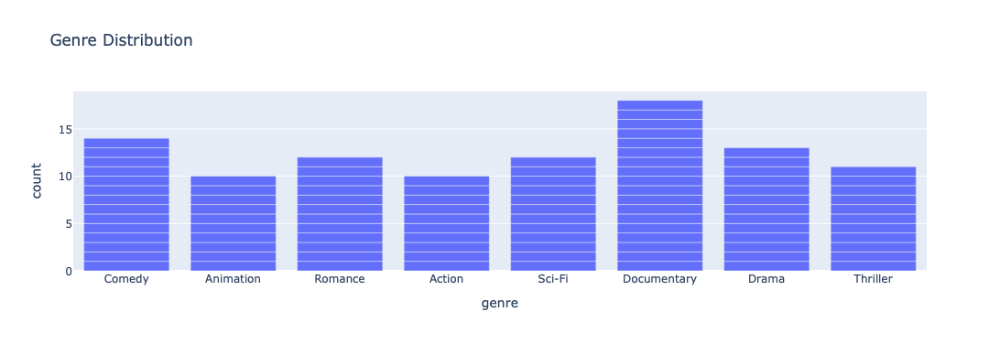

In [5]:
fig = px.bar(df.head(100),
             x='genre',
             title="Genre Distribution")

fig.show()

0.5 bar graph(count vs genre)

The Count vs Genre bar graph shows how many times each genre appears in the dataset. The Xaxis represents different genres such as Action, Comedy, Drama, or Thriller. The Y-axis represents
the count, which means the number of shows or movies watched in each genre. This graph helps
us understand which genre is most popular among viewers. Genres with taller bars indicate that
they are watched more frequently compared to others


## pie chart about device usage distribution

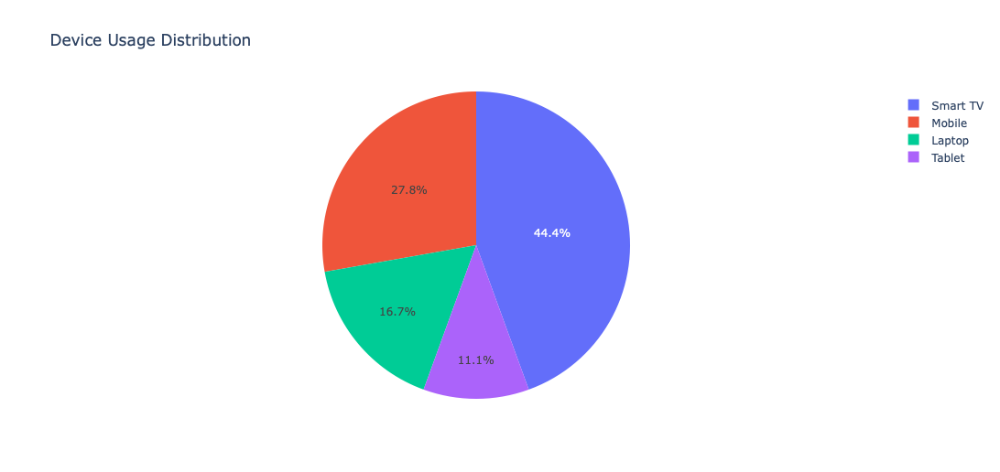

In [12]:
fig = px.pie(df.head(18),
             names='device_type',
             title='Device Usage Distribution', width=500,height=500)

fig.show()

0.6 pie chart about device usage distribution

The Device Usage Distribution pie chart shows how viewers watch content using different devices.Each slice of the pie represents a device type, such as mobile, laptop, tablet, or smart TV. The size of each slice indicates the percentage of viewers using that device to watch content. Larger slices
mean that more viewers prefer that particular device. This chart helps understand which devices are most commonly used for watching shows or movies. Overall, it provides insight into viewer device preferences and platform accessibility


## Scatter plot(Completion rate vs rating)

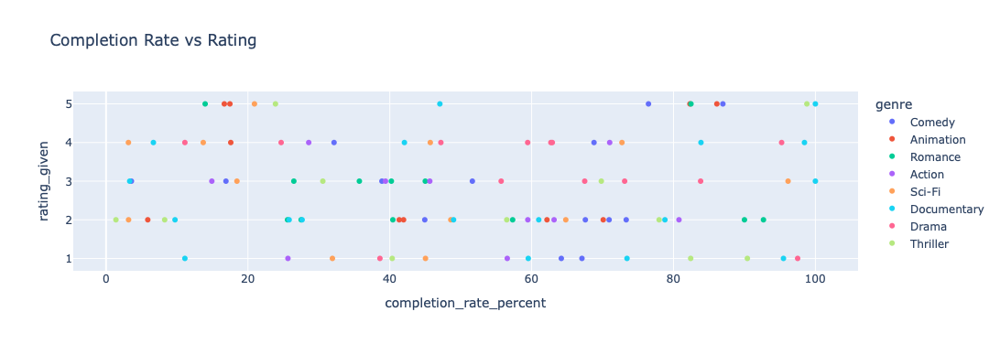

In [5]:
fig = px.scatter(df.head(100),
                 x='completion_rate_percent',
                 y='rating_given',
                 color='genre',
                 title="Completion Rate vs Rating")

fig.show()

0.7 scatter plot(rating_given vs completion_rate_percent)

The Scatter Plot of Rating Given vs Completion Rate Percent shows the relationship between how
much of the content viewers completed and the ratings they provided. The X-axis represents the
completion rate percentage, which indicates how much of the video or show was watched. The
Y-axis represents the rating given by viewers, usually from 1 to 5. Each point in the scatter plot
represents a viewer’s completion rate and the rating they gave. This graph helps identify whether
viewers who watch a higher percentage of the content tend to give higher ratings, indicating stronger
engagement and satisfaction


## Histogram(Count vs watch_start_hour)

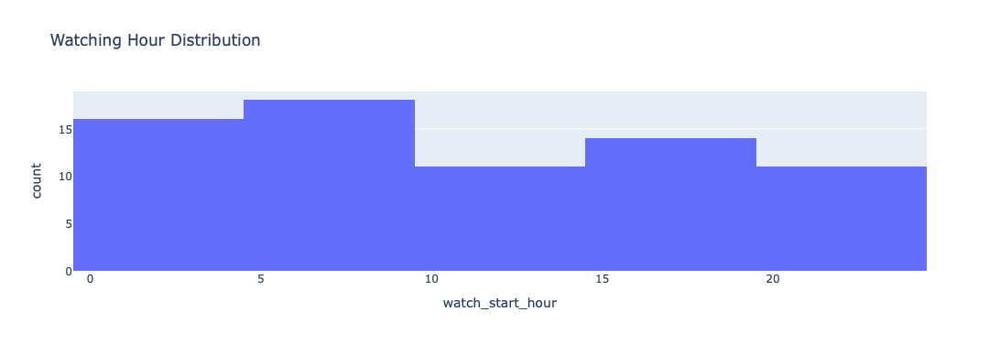

In [15]:
fig = px.histogram(df.head(70),
                   x='watch_start_hour',
                   title="Watching Hour Distribution")

fig.show()

0.8 histogram(count vs watch_start_hour)

The Histogram of Count vs Watch Start Hour shows the distribution of when viewers start watching
content during the day. The X-axis represents the watch start hour, usually from 0 to 23 hours
of the day. The Y-axis represents the count, which indicates the number of times viewers started
watching at each hour. Each bar in the histogram shows how many viewing sessions began within
that time range. This graph helps identify peak viewing times, showing when most users prefer to
that time range. watch content on the platform

## bar graph(count vs genre)

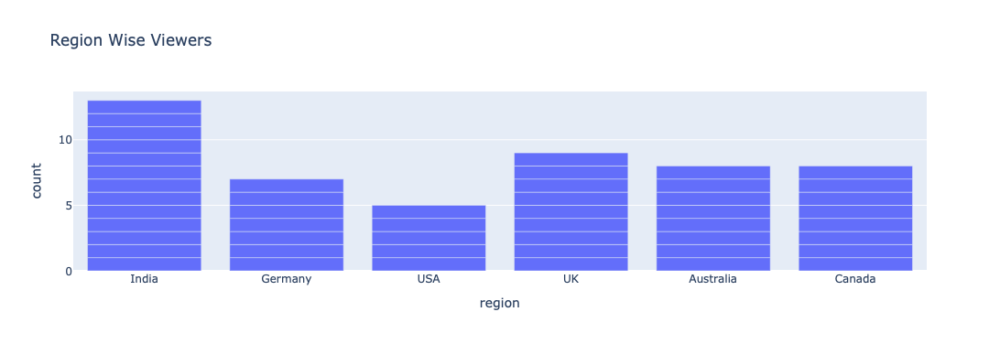

In [16]:
fig = px.bar(df.tail(50),
             x='region',
             title="Region Wise Viewers")

fig.show()

0.9 bar graph ( count vs region)

The Count vs Region bar graph shows how many viewers or watch sessions come from different regions in the dataset. The X-axis represents the regions (such as different countries or geographic areas). The Y-axis represents the count, which indicates the number of viewing activities from each region. Each bar shows how frequently viewers from a particular region watch content. This graph helps identify which regions have the highest number of viewers. Regions with taller bars indicate greater audience engagement on the platform.


## pie chart(rewatch vs first watch)

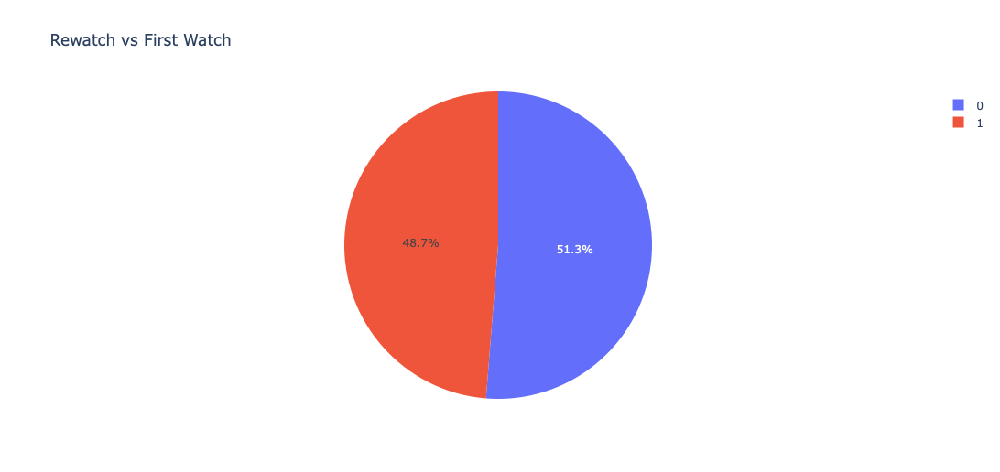

In [17]:
fig = px.pie(df,
             names='rewatch_flag',
             title="Rewatch vs First Watch",width=500,height=500)

fig.show()

0.10 pie chart rewatch vs first watch)

The Rewatch vs First Watch pie chart shows the proportion of viewers who are watching content for the first time compared to those who rewatch the same content. Each slice of the pie represents one category: First Watch or Rewatch. The size of each slice indicates the percentage of viewers in that category. A larger slice for First Watch means most viewers are watching new content, while a larger Rewatch slice shows that viewers like to watch the same content again. This chart helps understand viewer behavior and content popularity on the platform.

## Box plot(subscription type vs rating type)

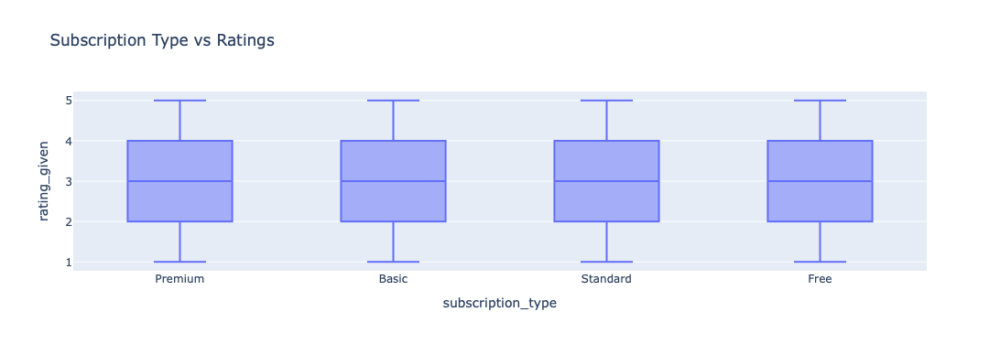

In [18]:
fig = px.box(df,
             x='subscription_type',
             y='rating_given',
             title="Subscription Type vs Ratings")

fig.show()

fig = px.sunburst(
df,
path=['genre','device_type','subscription_type'],
title="Viewing Hierarchy: Genre → Device → Subscription"
)
fig.show()

Box plot(subscription type vs rating)

The box plot illustrates how user ratings vary across different subscription types such as Premium, Basic, Standard, and Free. Each box represents the distribution of ratings, showing the median, quartiles, and possible variation in user feedback. From the graph, we can observe that ratings are fairly similar across all subscription plans, indicating that subscription type does not significantly affect user satisfaction. The spread of the boxes also shows how consistent or varied the ratings are within each subscription category. This visualization helps in understanding viewer satisfaction patterns across different subscription plans.

## Funnel chart(viewer completion funnel)

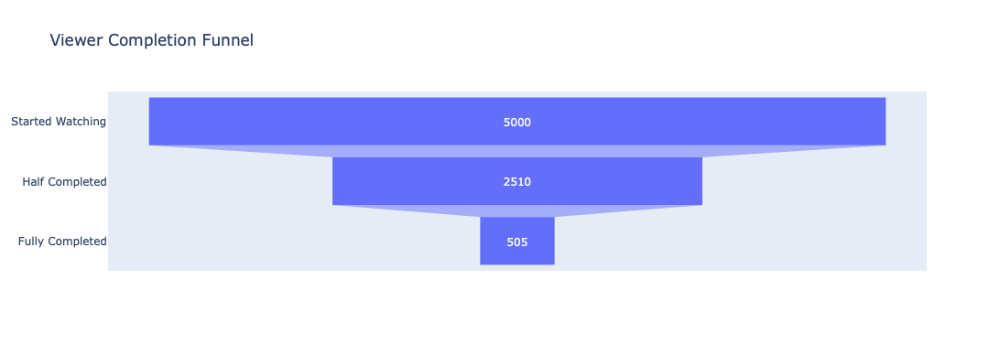

In [19]:
stage = ["Started Watching","Half Completed","Fully Completed"]
values = [
len(df),
df[df['completion_rate_percent'] > 50].shape[0],
df[df['completion_rate_percent'] > 90].shape[0]
]
fig = go.Figure(go.Funnel(
y=stage,
x=values
))
fig.update_layout(title="Viewer Completion Funnel")
fig.show()

funnel chart

The funnel chart represents the viewer completion stages in the watch pattern analysis. It shows how many users start watching a video, how many watch at least half of it, and how many complete it fully. From the graph, we can see that 5000 viewers started watching, 2510 viewers watched more than half, and 505 viewers completed the content. The decreasing shape of the funnel indicates that many viewers drop off before finishing the video. This visualization helps analyze viewer engagement and content retention on the streaming platform.

## Line Graph(Watch Hour Pattern)

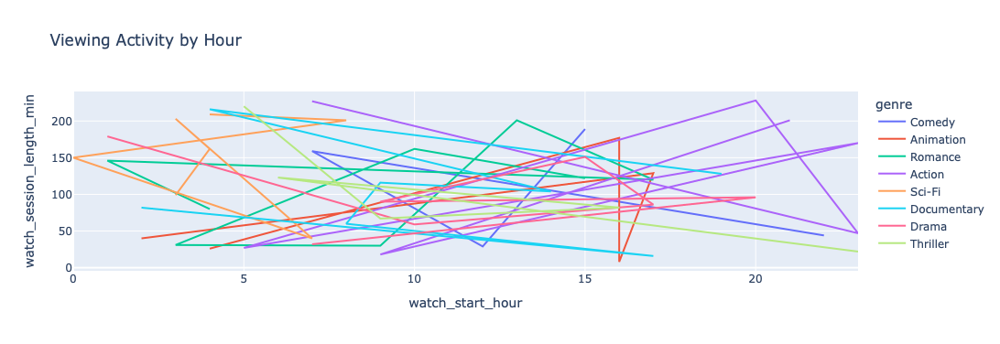

In [20]:
fig = px.line(df.head(50),
              x="watch_start_hour",
              y="watch_session_length_min",
              color="genre",
              title="Viewing Activity by Hour")

fig.show()

Watch hour pattern

This line graph represents the Viewing Activity by Hour based on the watch start time and session length. The x-axis shows the watch start hour, while the y-axis represents the watch session length in minutes. Different colored lines indicate various genres such as Comedy, Animation, Romance, Action, and others. The graph helps visualize how long users watch content at different times of the day and how viewing duration varies across genres. It provides insight into user watch patterns and peak viewing hours. 

## Content Popularity Chart

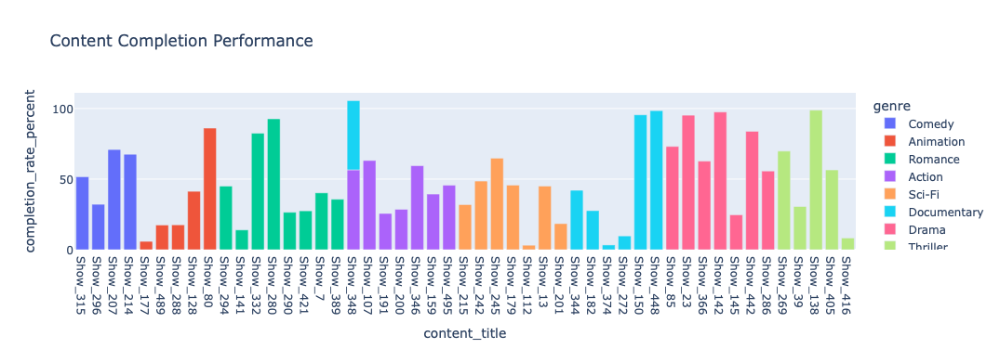

In [21]:
fig = px.bar(df.head(50),
             x="content_title",
             y="completion_rate_percent",
             color="genre",
             title="Content Completion Performance")

fig.show()

Content Popularity chart

The bar chart represents the content completion rate percentage for different titles on the streaming platform. Each bar shows how much of the content viewers watched, while different colors represent various genres such as Comedy, Animation, Romance, Action, Sci-Fi, Documentary, and Drama. A higher completion rate indicates that viewers watched most or all of the content, suggesting greater engagement. By comparing the bars, we can identify which genres or titles keep viewers interested until the end. This visualization helps analyze viewer engagement and the popularity of different types of content.

## Animation 1 — Genre Watching Over Time

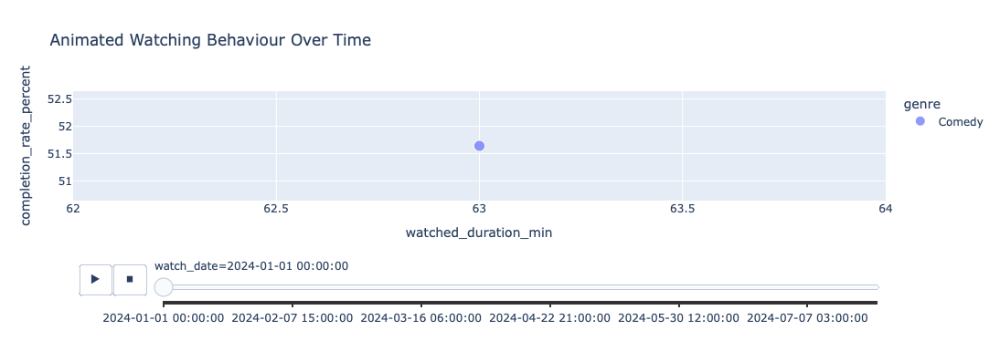

In [22]:
df["watch_date"] = df["watch_date"].astype(str)

fig = px.scatter(df,
                 x="watched_duration_min",
                 y="completion_rate_percent",
                 animation_frame="watch_date",
                 color="genre",
                 size="watch_session_length_min",
                 title="Animated Watching Behaviour Over Time")

fig.show()

This animated scatter plot shows watching behavior over time for different genres. The x-axis represents watched duration in minutes, while the y-axis shows the completion rate percentage. Each point represents a watching session, where the color indicates the genre and the size of the bubble represents the watch session length. The animation changes according to the watch date, helping to observe how user viewing patterns evolve over time. This visualization helps identify **user engagement and genre preferences

## Animation 2 — Device Usage Evolution

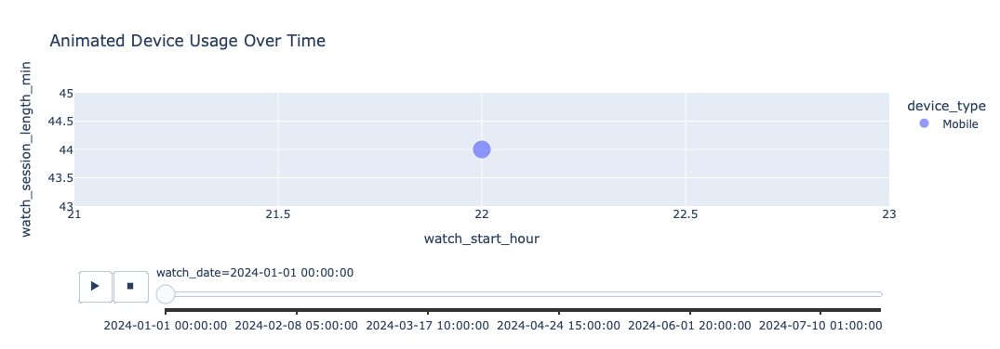

In [23]:
fig = px.scatter(df,
                 x="watch_start_hour",
                 y="watch_session_length_min",
                 animation_frame="watch_date",
                 color="device_type",
                 size="completion_rate_percent",
                 title="Animated Device Usage Over Time")

fig.show()

This animated scatter plot shows the evolution of device usage over time. The x-axis represents the watch start hour, while the y-axis shows the watch session length in minutes. Each point represents a viewing session, where the color indicates the type of device used (such as mobile, laptop, etc.). The size of the bubble represents the completion rate percentage of the content watched. The animation changes by watch date, helping to analyze how device usage patterns change over time.

## 3D Plot — Viewing Behavior Analysis

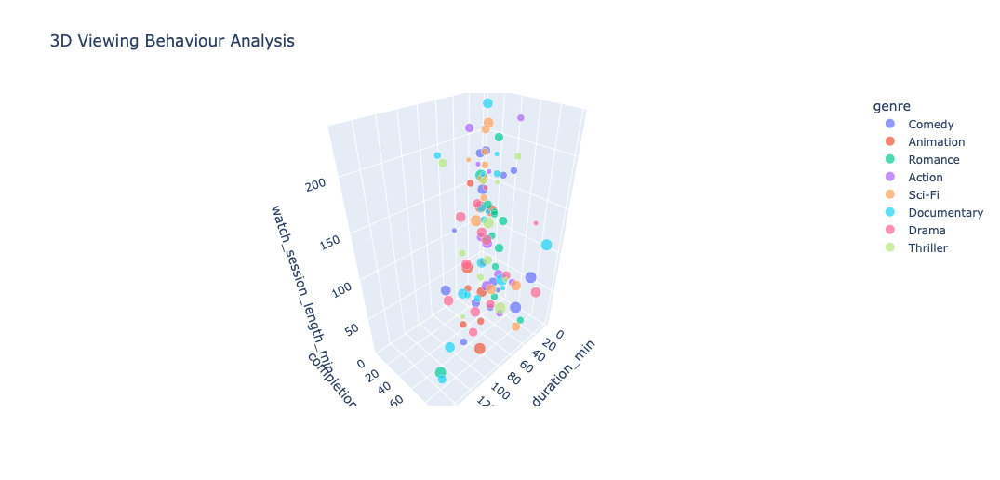

In [24]:
fig = px.scatter_3d(df.head(100),
                    x="watched_duration_min",
                    y="completion_rate_percent",
                    z="watch_session_length_min",
                    color="genre",
                    size="rating_given",
                    title="3D Viewing Behaviour Analysis",width=500,height=500)

fig.show()

This 3D scatter plot represents viewing behavior analysis of users. The x-axis shows the watched duration in minutes, the y-axis represents the completion rate percentage, and the z-axis indicates the watch session length in minutes. Each point represents a viewing session, where the color indicates the genre of the content. The size of the points represents the rating given by users. This visualization helps analyze the relationship between watch time, completion rate, session length, and user ratings across different genres. 

## Genre vs Rating Bubble Plot

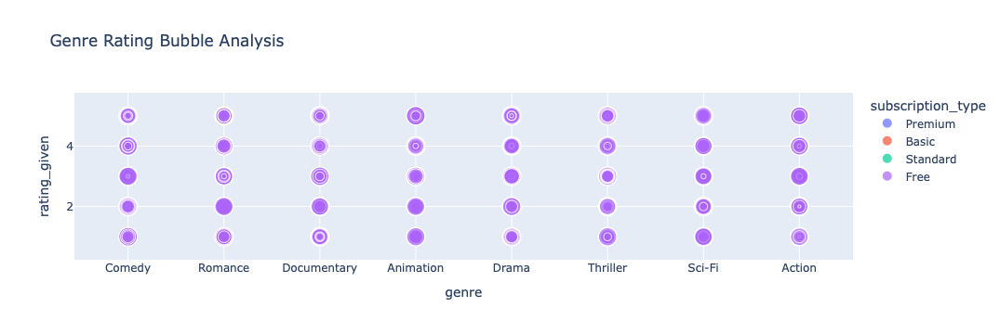

In [25]:
fig = px.scatter(df,
                 x="genre",
                 y="rating_given",
                 size="completion_rate_percent",
                 color="subscription_type",
                 title="Genre Rating Bubble Analysis")

fig.show()

This bubble plot shows the relationship between content genre and user ratings. The x-axis represents different genres, while the y-axis shows the ratings given by users. Each bubble represents a viewing record, where the size of the bubble indicates the completion rate percentage. The color of the bubbles represents different subscription types such as Premium, Basic, Standard, and Free. This visualization helps analyze how ratings and completion rates vary across genres and subscription types.

## Genre Preference Dashboard

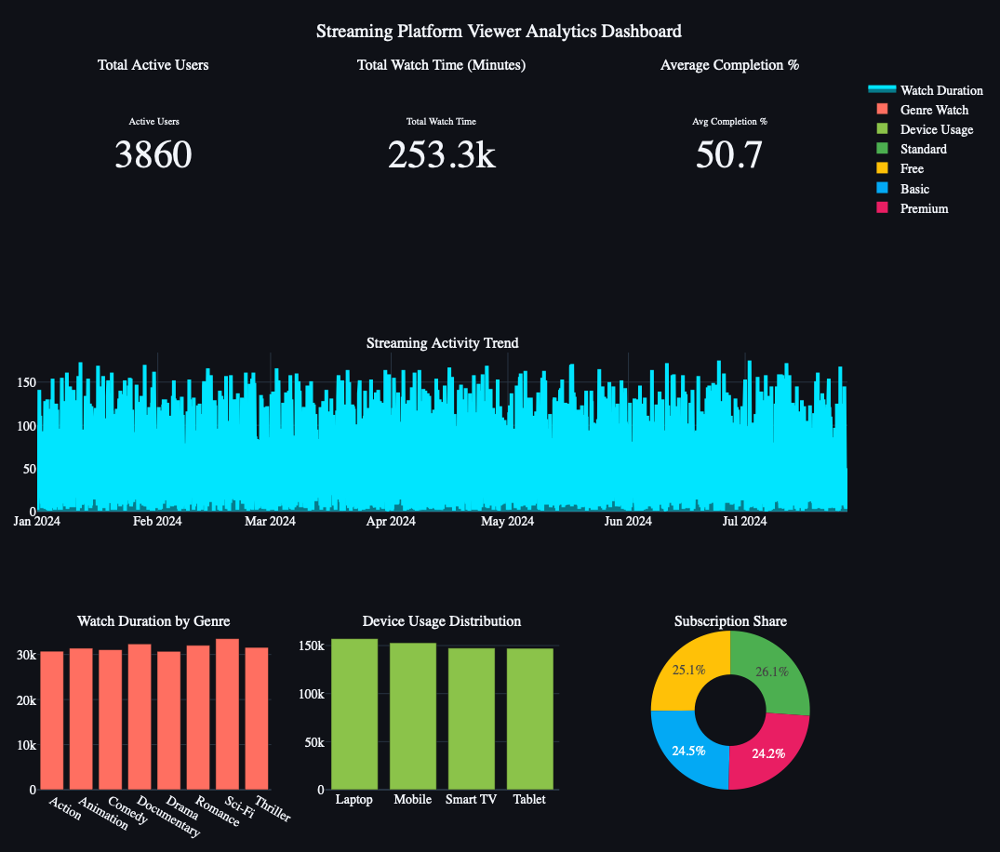

In [26]:
df["watch_date"] = pd.to_datetime(df["watch_date"])


total_users = df["user_id"].nunique()
total_watch_time = df["watched_duration_min"].sum()
avg_completion = df["completion_rate_percent"].mean()
avg_rating = df["rating_given"].mean()


trend = df.groupby("watch_date")["watched_duration_min"].sum().reset_index()

genre_watch = df.groupby("genre")["watched_duration_min"].sum().reset_index()

device_sessions = df.groupby("device_type")["watch_session_length_min"].sum().reset_index()

subscription_share = df.groupby("subscription_type")["watched_duration_min"].sum().reset_index()


fig = make_subplots(
rows=3, cols=3,
specs=[
[{"type":"indicator"},{"type":"indicator"},{"type":"indicator"}],
[{"colspan":3,"type":"xy"},None,None],
[{"type":"xy"},{"type":"xy"},{"type":"domain"}]
],

subplot_titles=(
"Total Active Users",
"Total Watch Time (Minutes)",
"Average Completion %",
"Streaming Activity Trend",
"Watch Duration by Genre",
"Device Usage Distribution",
"Subscription Share"
)
)


fig.add_trace(go.Indicator(
mode="number",
value=total_users,
number={'font':{'size':42}},
title={"text":"Active Users"}
),row=1,col=1)

fig.add_trace(go.Indicator(
mode="number",
value=total_watch_time,
number={'font':{'size':42}},
title={"text":"Total Watch Time"}
),row=1,col=2)

fig.add_trace(go.Indicator(
mode="number",
value=avg_completion,
number={'font':{'size':42}},
title={"text":"Avg Completion %"}
),row=1,col=3)


fig.add_trace(go.Scatter(
x=trend["watch_date"],
y=trend["watched_duration_min"],
mode="lines",
line=dict(width=4,color="#00E5FF"),
fill="tozeroy",
name="Watch Duration"
),row=2,col=1)


fig.add_trace(go.Bar(
x=genre_watch["genre"],
y=genre_watch["watched_duration_min"],
marker=dict(color="#FF6F61"),
name="Genre Watch"
),row=3,col=1)


fig.add_trace(go.Bar(
x=device_sessions["device_type"],
y=device_sessions["watch_session_length_min"],
marker=dict(color="#8BC34A"),
name="Device Usage"
),row=3,col=2)


fig.add_trace(go.Pie(
labels=subscription_share["subscription_type"],
values=subscription_share["watched_duration_min"],
hole=0.45,
marker=dict(colors=["#03A9F4","#FFC107","#E91E63","#4CAF50"])
),row=3,col=3)


fig.update_layout(

template="plotly_dark",

height=900,
width=1400,

title={
"text":" Streaming Platform Viewer Analytics Dashboard",
"x":0.5,
"xanchor":"center"
},

font=dict(
family="Segoe UI",
size=14
),

paper_bgcolor="#0f1117",
plot_bgcolor="#0f1117",

margin=dict(l=40,r=40,t=80,b=40)

)

fig.show()

The Watch Pattern Analysis Dashboard visualizes user streaming behavior and engagement patterns. It displays key performance indicators such as Total Active Users (3860), Total Watch Time (253.3k minutes), and Average Completion Rate (50.7%) to summarize overall platform activity. These indicators help in understanding how many users are actively watching content and how much time they spend on the platform.
The dashboard also includes a Streaming Activity Trend graph that shows how watch time changes over different dates throughout the year. This helps identify peaks and fluctuations in user viewing activity. By analyzing these trends, the platform can understand when users are most active.
Overall, the dashboard provides a clear overview of user engagement, viewing patterns, and streaming trends, which can help in improving content recommendations and platform performance.

## Conclusion

The watch pattern analysis shows that smartphones are the most commonly used devices for watching content, highlighting the importance of mobile-friendly platforms. It also indicates that subscription type influences user ratings, with premium users generally giving higher and more consistent ratings.
Overall, the analysis helps in understanding user viewing behavior, device preferences, and engagement levels, which can support improvements in content strategy and user experience on streaming platforms.

